In [1]:
import numpy as np
import matplotlib.pyplot as plt
from UNET_adv import UNET

eager execution is activated. Tensorflow version is: 1


[||||||||||||||||||||] 100.0%                                      
Done!
<class 'numpy.memmap'>
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 128, 128, 64) 0           conv2d_1[0][0]                 

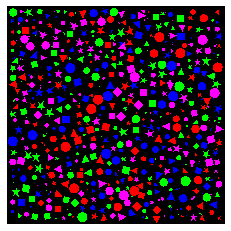

In [2]:
model_1=UNET(64,512).fix_data().build_model(lr=.001,path='')

Epoch 1/60
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
37/37 [==============================] - 31s 849ms/step - loss: 0.8836 - acc: 0.7247 - val_loss: 0.4588 - val_acc: 0.8083
Epoch 2/60
37/37 [==============================] - 24s 659ms/step - loss: 0.3978 - acc: 0.8254 - val_loss: 0.3961 - val_acc: 0.8251
Epoch 3/60
37/37 [==============================] - 24s 657ms/step - loss: 0.3716 - acc: 0.8277 - val_loss: 0.3780 - val_acc: 0.8419
Epoch 4/60
37/37 [==============================] - 24s 659ms/step - loss: 0.3627 - acc: 0.8305 - val_loss: 0.3791 - val_acc: 0.8356
Epoch 5/60
37/37 [==============================] - 24s 658ms/step - loss: 0.3595 - acc: 0.8314 - val_loss: 0.3695 - val_acc: 0.8466
Epoch 6/60
37/37 [==============================] - 24s 657ms/step - loss: 0.3530 - acc: 0.8320 - val_loss: 0.3601 - val_acc: 0.8438
Epoch 7/60
37/37 [==============================] - 24s 656ms/step - loss: 0.3357 - acc: 0.8420 - val_loss: 

Epoch 60/60
37/37 [==============================] - 24s 643ms/step - loss: 0.0271 - acc: 0.9890 - val_loss: 0.0573 - val_acc: 0.9805


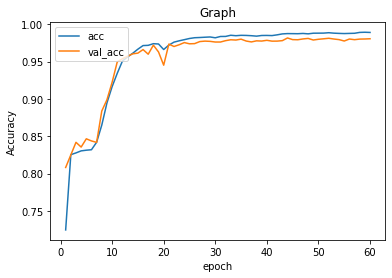

In [3]:
model_1.train(60,18,safe=False,draw=True)

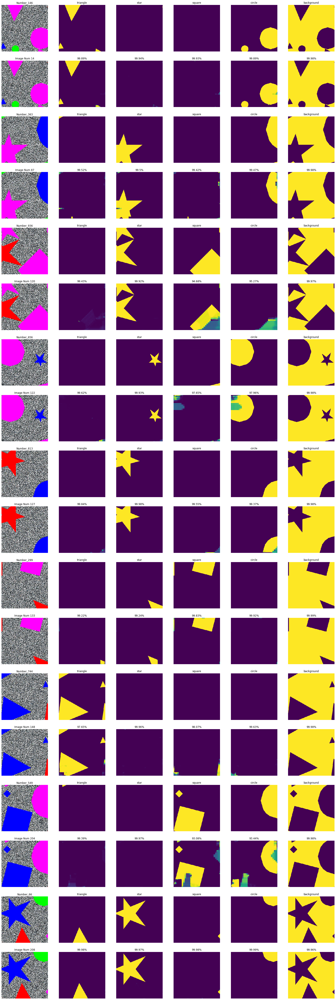

223/223 - 5s - loss: 0.0490 - acc: 0.9838


In [4]:
_=model_1.predict(size=10)

In [5]:
data=model_1.selectiv_(model_1.train_data,model_1.train_mask,.01)
exp_data=model_1.train_data
for x in range(6):
    exp_data=model_1.distill_patterns(exp_data,model_1.train_mask,-1,.001,x,iterativ=True)

[||||||||||||||||||||] 100.0%  
Done!
[||||||||||||||||||||] 100.0%
Done!
[||||||||||||||||||||] 100.0%
Done!
[||||||||||||||||||||] 100.0%
Done!
[||||||||||||||||||||] 100.0%
Done!
[||||||||||||||||||||] 100.0%
Done!
[||||||||||||||||||||] 100.0%
Done!


loaded
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 256, 256, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_18 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_17[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_3 (MaxPooling2D)  (None, 128, 128, 64) 0           conv2d_18[0][0]                  
_____________________________________________________________________________________

37/37 [==============================] - 24s 643ms/step - loss: 0.1413 - acc: 0.9442 - val_loss: 0.1525 - val_acc: 0.9438
Epoch 14/60
37/37 [==============================] - 24s 642ms/step - loss: 0.1090 - acc: 0.9581 - val_loss: 0.1158 - val_acc: 0.9580
Epoch 15/60
37/37 [==============================] - 24s 642ms/step - loss: 0.0981 - acc: 0.9631 - val_loss: 0.1048 - val_acc: 0.9615
Epoch 16/60
37/37 [==============================] - 24s 644ms/step - loss: 0.0962 - acc: 0.9632 - val_loss: 0.1143 - val_acc: 0.9583
Epoch 17/60
37/37 [==============================] - 24s 643ms/step - loss: 0.0865 - acc: 0.9670 - val_loss: 0.0953 - val_acc: 0.9647
Epoch 18/60
37/37 [==============================] - 24s 643ms/step - loss: 0.0722 - acc: 0.9734 - val_loss: 0.0850 - val_acc: 0.9692
Epoch 19/60
37/37 [==============================] - 24s 643ms/step - loss: 0.0684 - acc: 0.9750 - val_loss: 0.0784 - val_acc: 0.9690
Epoch 20/60
37/37 [==============================] - 24s 643ms/step - loss

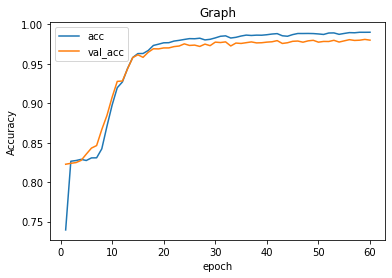

In [6]:
model_2=UNET(64,512).load_data(model_1.return_data()).build_model(lr=.001,path='')
model_2.train(60,18,safe=False,data=data,mask=model_2.train_mask,draw=True)

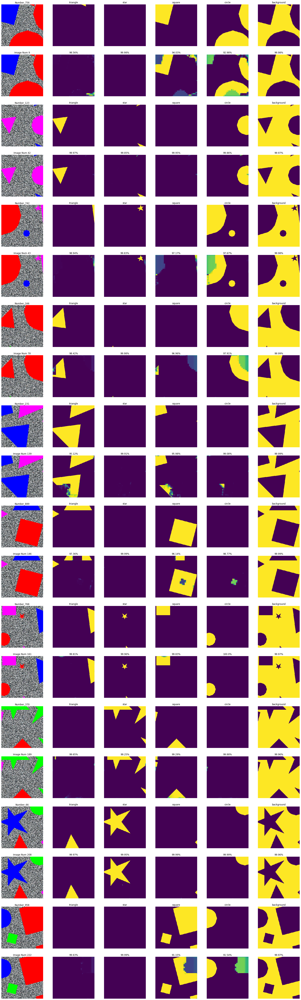

223/223 - 2s - loss: 0.0551 - acc: 0.9829


In [7]:
_=model_2.predict(size=10)

loaded
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 256, 256, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_35 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_34[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_6 (MaxPooling2D)  (None, 128, 128, 64) 0           conv2d_35[0][0]                  
_____________________________________________________________________________________

37/37 [==============================] - 24s 642ms/step - loss: 0.1723 - acc: 0.9283 - val_loss: 0.2355 - val_acc: 0.9096
Epoch 14/60
37/37 [==============================] - 24s 642ms/step - loss: 0.1560 - acc: 0.9348 - val_loss: 0.1544 - val_acc: 0.9389
Epoch 15/60
37/37 [==============================] - 24s 642ms/step - loss: 0.1360 - acc: 0.9448 - val_loss: 0.1565 - val_acc: 0.9385
Epoch 16/60
37/37 [==============================] - 24s 642ms/step - loss: 0.1221 - acc: 0.9523 - val_loss: 0.1160 - val_acc: 0.9533
Epoch 17/60
37/37 [==============================] - 24s 641ms/step - loss: 0.1033 - acc: 0.9590 - val_loss: 0.1756 - val_acc: 0.9345
Epoch 18/60
37/37 [==============================] - 24s 643ms/step - loss: 0.1074 - acc: 0.9578 - val_loss: 0.1134 - val_acc: 0.9586
Epoch 19/60
37/37 [==============================] - 24s 641ms/step - loss: 0.0881 - acc: 0.9658 - val_loss: 0.1252 - val_acc: 0.9576
Epoch 20/60
37/37 [==============================] - 24s 643ms/step - loss

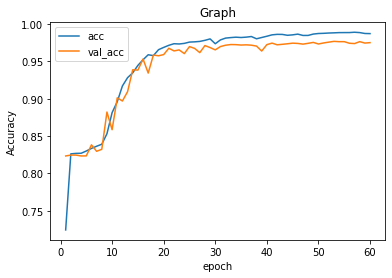

In [8]:
model_3=UNET(64,512).load_data(model_1.return_data()).build_model(lr=.001,path='')
model_3.train(60,18,safe=False,data=exp_data,mask=model_3.train_mask,draw=True)

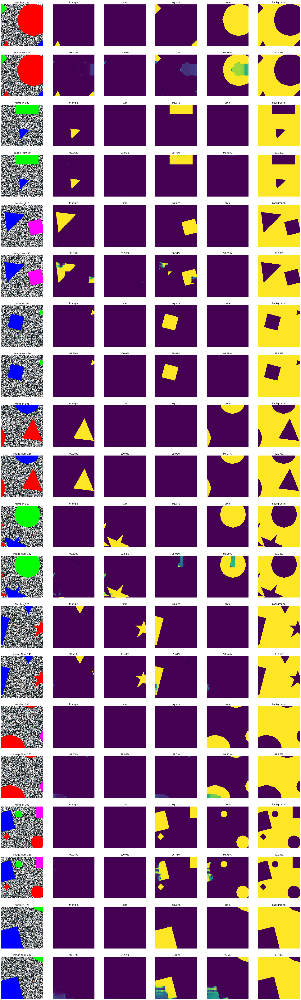

223/223 - 2s - loss: 0.0695 - acc: 0.9786


In [9]:
_=model_3.predict(size=10)

loaded
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_51 (Conv2D)              (None, 256, 256, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_52 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_51[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_9 (MaxPooling2D)  (None, 128, 128, 64) 0           conv2d_52[0][0]                  
_____________________________________________________________________________________

Epoch 13/40
111/111 [==============================] - 70s 633ms/step - loss: 0.0483 - acc: 0.9820 - val_loss: 0.0729 - val_acc: 0.9755
Epoch 14/40
111/111 [==============================] - 70s 634ms/step - loss: 0.0482 - acc: 0.9820 - val_loss: 0.0603 - val_acc: 0.9790
Epoch 15/40
111/111 [==============================] - 70s 632ms/step - loss: 0.0396 - acc: 0.9849 - val_loss: 0.0554 - val_acc: 0.9816
Epoch 16/40
111/111 [==============================] - 70s 632ms/step - loss: 0.0382 - acc: 0.9856 - val_loss: 0.0660 - val_acc: 0.9795
Epoch 17/40
111/111 [==============================] - 70s 632ms/step - loss: 0.0404 - acc: 0.9846 - val_loss: 0.0554 - val_acc: 0.9800
Epoch 18/40
111/111 [==============================] - 70s 632ms/step - loss: 0.0362 - acc: 0.9864 - val_loss: 0.0596 - val_acc: 0.9793
Epoch 19/40
111/111 [==============================] - 70s 633ms/step - loss: 0.0371 - acc: 0.9858 - val_loss: 0.0663 - val_acc: 0.9807
Epoch 20/40
111/111 [===========================

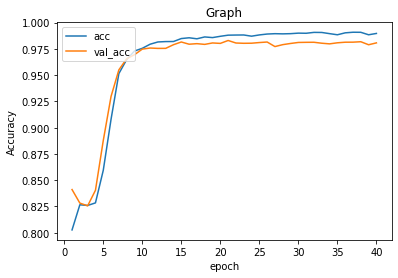

In [10]:
fin_train_data=np.concatenate([data,model_1.train_data,exp_data],axis=0)
fin_train_mask=np.concatenate([model_1.train_mask,model_1.train_mask,model_1.train_mask],axis=0)

model_4=UNET(64,512).load_data(model_1.return_data()).build_model(lr=.001,path='')
model_4.train(40,18,safe=False,data=fin_train_data,mask=fin_train_mask,draw=True)

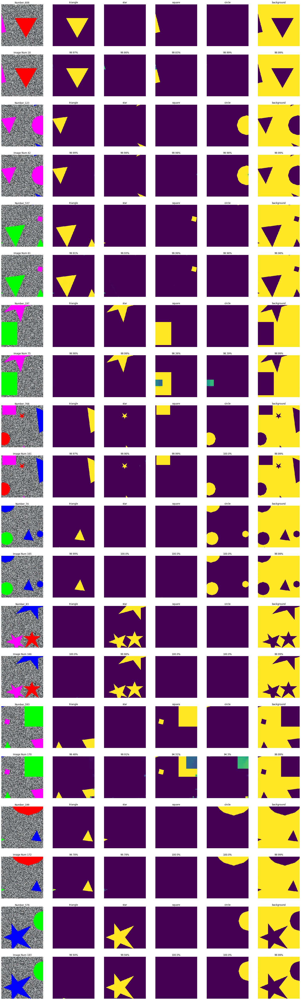

223/223 - 2s - loss: 0.0538 - acc: 0.9841


In [11]:
_=model_4.predict(size=10)

loaded
Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_68 (Conv2D)              (None, 256, 256, 64) 1792        input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_69 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_68[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_12 (MaxPooling2D) (None, 128, 128, 64) 0           conv2d_69[0][0]                  
_____________________________________________________________________________________

74/74 [==============================] - 48s 642ms/step - loss: 0.0502 - acc: 0.9809 - val_loss: 0.0682 - val_acc: 0.9760
Epoch 14/80
74/74 [==============================] - 47s 641ms/step - loss: 0.0497 - acc: 0.9810 - val_loss: 0.0766 - val_acc: 0.9713
Epoch 15/80
74/74 [==============================] - 48s 642ms/step - loss: 0.0466 - acc: 0.9821 - val_loss: 0.0572 - val_acc: 0.9785
Epoch 16/80
74/74 [==============================] - 48s 643ms/step - loss: 0.0468 - acc: 0.9823 - val_loss: 0.0613 - val_acc: 0.9773
Epoch 17/80
74/74 [==============================] - 47s 641ms/step - loss: 0.0438 - acc: 0.9827 - val_loss: 0.0641 - val_acc: 0.9753
Epoch 18/80
74/74 [==============================] - 47s 641ms/step - loss: 0.0388 - acc: 0.9848 - val_loss: 0.0651 - val_acc: 0.9785
Epoch 19/80
74/74 [==============================] - 47s 640ms/step - loss: 0.0369 - acc: 0.9856 - val_loss: 0.0650 - val_acc: 0.9772
Epoch 20/80
74/74 [==============================] - 47s 640ms/step - loss

74/74 [==============================] - 45s 602ms/step - loss: 0.0177 - acc: 0.9921 - val_loss: 0.0849 - val_acc: 0.9811
Epoch 75/80
74/74 [==============================] - 45s 603ms/step - loss: 0.0189 - acc: 0.9918 - val_loss: 0.0701 - val_acc: 0.9797
Epoch 76/80
74/74 [==============================] - 45s 608ms/step - loss: 0.0199 - acc: 0.9915 - val_loss: 0.0661 - val_acc: 0.9815
Epoch 77/80
74/74 [==============================] - 45s 610ms/step - loss: 0.0184 - acc: 0.9920 - val_loss: 0.0809 - val_acc: 0.9812
Epoch 78/80
74/74 [==============================] - 44s 594ms/step - loss: 0.0178 - acc: 0.9923 - val_loss: 0.0887 - val_acc: 0.9810
Epoch 79/80
74/74 [==============================] - 44s 593ms/step - loss: 0.0177 - acc: 0.9921 - val_loss: 0.0866 - val_acc: 0.9815
Epoch 80/80
74/74 [==============================] - 44s 592ms/step - loss: 0.0174 - acc: 0.9923 - val_loss: 0.0825 - val_acc: 0.9818


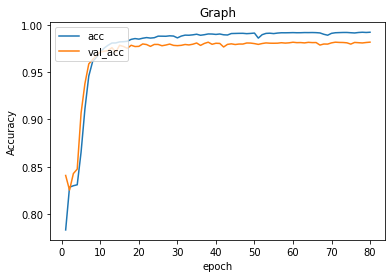

In [12]:
fin_train_data=np.concatenate([model_1.train_data,exp_data],axis=0)
fin_train_mask=np.concatenate([model_1.train_mask,model_1.train_mask],axis=0)

model_5=UNET(64,512).load_data(model_1.return_data()).build_model(lr=.001,path='')
model_5.train(80,18,safe=False,data=fin_train_data,mask=fin_train_mask,draw=True)

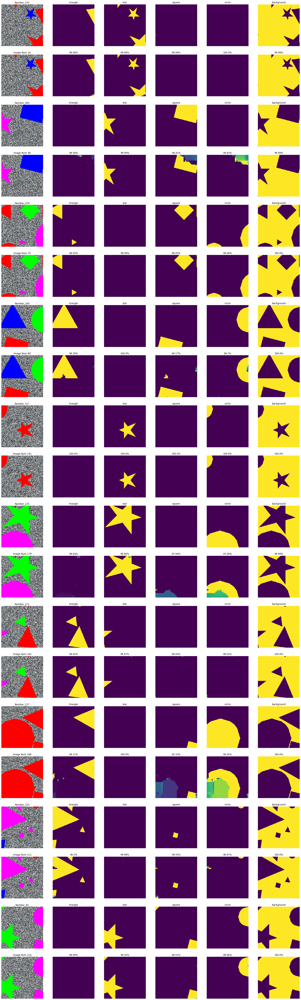

223/223 - 2s - loss: 0.0653 - acc: 0.9852


In [13]:
_=model_5.predict(size=10)

In [14]:
attack_bg=model_1.distill_patterns(model_1.test_data,model_1.test_mask,-1,.001,5,iterativ=True)

[||||||||||||||||||||] 100.0%
Done!


In [15]:
_=model_1.predict(attack_bg,model_1.test_mask,draw=False)
_=model_2.predict(attack_bg,model_1.test_mask,draw=False)
_=model_3.predict(attack_bg,model_1.test_mask,draw=False)
_=model_4.predict(attack_bg,model_1.test_mask,draw=False)
_=model_5.predict(attack_bg,model_1.test_mask,draw=False)

223/223 - 2s - loss: 0.0925 - acc: 0.9652
223/223 - 2s - loss: 0.1426 - acc: 0.9667
223/223 - 2s - loss: 0.0648 - acc: 0.9794
223/223 - 2s - loss: 0.0536 - acc: 0.9839
223/223 - 2s - loss: 0.0663 - acc: 0.9849


In [17]:
augment_data=data=model_1.selectiv_(model_1.test_data,model_1.test_mask,.01)

[||||||||||||||||||||] 100.0%  
Done!


In [18]:
_=model_1.predict(augment_data,model_1.test_mask,draw=False)
_=model_2.predict(augment_data,model_1.test_mask,draw=False)
_=model_3.predict(augment_data,model_1.test_mask,draw=False)
_=model_4.predict(augment_data,model_1.test_mask,draw=False)
_=model_5.predict(augment_data,model_1.test_mask,draw=False)

223/223 - 2s - loss: 0.0374 - acc: 0.9870
223/223 - 2s - loss: 0.0443 - acc: 0.9847
223/223 - 2s - loss: 0.0693 - acc: 0.9785
223/223 - 2s - loss: 0.0528 - acc: 0.9842
223/223 - 2s - loss: 0.0639 - acc: 0.9853


In [19]:
_=model_1.predict(draw=False)
_=model_2.predict(draw=False)
_=model_3.predict(draw=False)
_=model_4.predict(draw=False)
_=model_5.predict(draw=False)

223/223 - 2s - loss: 0.0490 - acc: 0.9838
223/223 - 2s - loss: 0.0551 - acc: 0.9829
223/223 - 2s - loss: 0.0695 - acc: 0.9786
223/223 - 2s - loss: 0.0538 - acc: 0.9841
223/223 - 2s - loss: 0.0653 - acc: 0.9852


223/223 - 2s - loss: 0.0925 - acc: 0.9652


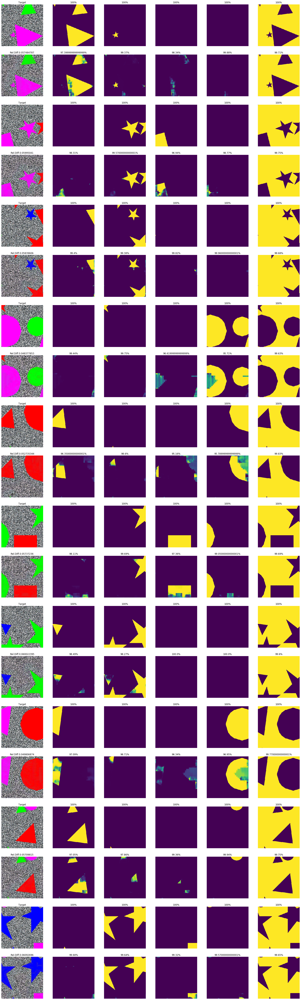

In [20]:
model_1.draw_random(model_1.test_data,attack_bg,model_1.test_mask,model_1.predict(attack_bg,model_1.test_mask,draw=False))

223/223 - 2s - loss: 0.0374 - acc: 0.9870


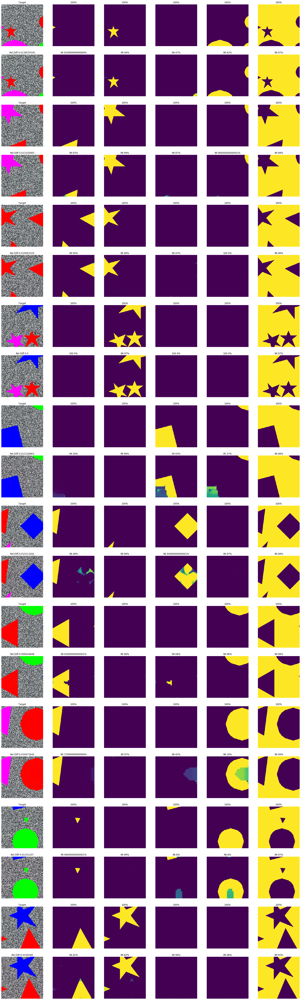

In [21]:
model_1.draw_random(model_1.test_data,augment_data,model_1.test_mask,model_1.predict(augment_data,model_1.test_mask,draw=False))